# TimePix MZI analysis written by Evan Klein and added to/edited by Trevor Donovan

In [1]:
#fun facts: data was centroided, this was 1 second long in total! note, the bins aren't the same as the non-centroided
#We did not actually take down how long the timepix ran for, but there is a roughly constant ratio between exp and obs freq, so
#I don't thinkit was actually 2 minutes. suppose it was 90s seconds instead. What happens?
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import time
import pandas as pd
import pickle

from matplotlib.animation import FuncAnimation
from IPython.display import clear_output

# Initializing variables 

In [2]:
cent_csv = "D:\Multiple_Files\MZ_GaAs-Ar_1s-exp_W0028_H07-240723-122753_cent.csv" # File location of _cent.csv file
exposure_time = 1. # Time in seconds of each exposure in the motor moving code
motorMovementsPerExposure = 10 # Found within the motor moving code
total_time = 90 # Time in units of the time division you choose that the TimePix ran for
bin_period = 1./50. # Time period you want each bin to span over in units of the time division you choose
time_div_label = "sec" # Time scale you want to use for plotting choose from: ms, sec, min, hrs, days

In [3]:
# Dictionary defining time scale you want to use for plotting
time_div_dict = {"ms" : 1/60, "sec" : 1, "min" : 60, "hrs" : 3600, "days" : 3600*24}
time_div_val = time_div_dict[time_div_label]

In [4]:
nbins = np.round(total_time / bin_period).astype(int)
print(f"{nbins} bins will be created over {total_time} {time_div_label}, meaning each bin has a period of {total_time/nbins} {time_div_label}")

4500 bins will be created over 90 sec, meaning each bin has a period of 0.02 sec


# Importing csv file

## Preview data

In [5]:
# Changing nrows affects how big an initial timechunk you collect (taking more rows takes longer but gives a better visual)
MZI_df_preview = pd.read_csv(cent_csv, nrows=10000000)
print(type(MZI_df_preview))
MZI_df_preview

<class 'pandas.core.frame.DataFrame'>


,#Col,#Row,#ToA,#ToT[arb],#ToTtotal[arb],#Centroid,#cent_X,#cent_Y,#centStdev_X,#centStdev_Y,#centStdev_ToA,Unnamed: 11
0,110,117,157335163904,200,325,2,110.500000,117.115385,0.500000,0.697629,4736,NaN
1,110,188,157335313920,250,250,1,110.500000,188.500000,0.500000,0.500000,0,NaN
2,47,246,157335684352,425,550,2,47.727273,246.500000,0.652395,0.500000,7808,NaN
3,106,57,157335740928,875,1350,3,106.740741,57.611111,0.657864,0.590564,6145,NaN
4,206,41,157335973376,425,425,1,206.500000,41.500000,0.500000,0.500000,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
9999995,209,136,1528475704832,175,225,2,209.722222,136.500000,0.650261,0.500000,1536,NaN
9999996,239,76,1528475971584,225,375,2,239.500000,76.100000,0.500000,0.700000,768,NaN
9999997,231,212,1528475993856,300,375,2,231.500000,212.300000,0.500000,0.640312,2048,NaN
9999998,175,114,1528476039680,750,950,2,175.289474,114.500000,0.645140,0.500000,4096,NaN


## Creating global bins by getting first and last timestamps

In [6]:
start_time = int(MZI_df_preview.iloc[0]['#ToA'])
print(f"The beginning timestamp is {start_time}.")

The beginning timestamp is 157335163904.


In [7]:
with open(cent_csv, 'rb') as file:
    #
    print(type(file))
    #
    file.seek(0, 2)  # seek(0, 2) tells the cursor to go 0 spaces away from the end
    file_size = file.tell() # file.tell() gives current cursor position
    pos = file_size - 1
    string = ''
    for i in range(pos):
        char = file.read(1).decode('utf-8') # file.read(1) reads character at current cursor position
        if char == '\n':
            break # Stop collecting characters once first delimeter is found
        string += char
        pos -= 1
        file.seek(pos, 0) # Moves cursor back one
    string = string[::-1] # Reverses order to give correct string of last row   
    print(f"The last row in the csv is: {string}")
    
last_row_arr = string.split(',')
end_time = int(last_row_arr[2]) # ToA should be in the 3rd column
print(f"The final timestamp is {end_time}.")

<class '_io.BufferedReader'>
The last row in the csv is: 109,229,16571334916352,375,625,2,109.900000,229.500000,0.700000,0.500000,4864,
The final timestamp is 16571334916352.


In [8]:
hist_bins = np.linspace(start_time, end_time, nbins+1) # nbins+1 is to ensure this is bin edges not just centers
hist_bin_centers = (hist_bins[:-1] + hist_bins[1:]) / 2.0 # List of centers of bins (Shorter than bin edges list by 1)

# Converting bin values from arbitrary timestamps to real time from start of experiment
bin_centers_rt = (np.array(hist_bin_centers) - start_time)/(end_time-start_time)*total_time

## Preview image for finding region limits

## Spectrum of Argon:
![Image of Argon spectra](ArSpectra.png)

In [9]:
#generate the following code block easily. between measurements, sometimes it's the same x and y shift you need to 
#put on the box locations, which the following part is made to help handle
xXs = np.array([56.6,67.8,76.6,90.1,102.2,115.7,129.,138.7,161.9,169.5,178.7,194.3]) #base position array
yYs = np.array([108.,108.,108.,108.,108.,108.,108.,107.,106.,106.,106.,106.,])

x1Xs = xXs +49.5
y1Ys = yYs +1.5 

x2Xs = xXs +49.5
y2Ys = yYs +16.5

lLs = [696.54, 706.72, 714.7, 727.29, 738.40, 750.39, 763.51, 772.38, 794.82, 801.48, 811.53, 826.45]

xr = 3
yr = 3

for i, l in enumerate(lLs):
    print(f'# {l} nm')
    print(f'spot_df.append([{str(l)}, 1, {str(y1Ys[i]-yr)}, {str(2*yr)}, {str(x1Xs[i]-xr)}, {str(2*xr)}])')
    print(f'spot_df.append([{str(l)}, 2, {str(y2Ys[i]-yr)}, {str(2*yr)}, {str(x2Xs[i]-xr)}, {str(2*xr)}])')
    print()

# 696.54 nm
spot_df.append([696.54, 1, 106.5, 6, 103.1, 6])
spot_df.append([696.54, 2, 121.5, 6, 103.1, 6])

# 706.72 nm
spot_df.append([706.72, 1, 106.5, 6, 114.3, 6])
spot_df.append([706.72, 2, 121.5, 6, 114.3, 6])

# 714.7 nm
spot_df.append([714.7, 1, 106.5, 6, 123.1, 6])
spot_df.append([714.7, 2, 121.5, 6, 123.1, 6])

# 727.29 nm
spot_df.append([727.29, 1, 106.5, 6, 136.6, 6])
spot_df.append([727.29, 2, 121.5, 6, 136.6, 6])

# 738.4 nm
spot_df.append([738.4, 1, 106.5, 6, 148.7, 6])
spot_df.append([738.4, 2, 121.5, 6, 148.7, 6])

# 750.39 nm
spot_df.append([750.39, 1, 106.5, 6, 162.2, 6])
spot_df.append([750.39, 2, 121.5, 6, 162.2, 6])

# 763.51 nm
spot_df.append([763.51, 1, 106.5, 6, 175.5, 6])
spot_df.append([763.51, 2, 121.5, 6, 175.5, 6])

# 772.38 nm
spot_df.append([772.38, 1, 105.5, 6, 185.2, 6])
spot_df.append([772.38, 2, 120.5, 6, 185.2, 6])

# 794.82 nm
spot_df.append([794.82, 1, 104.5, 6, 208.4, 6])
spot_df.append([794.82, 2, 119.5, 6, 208.4, 6])

# 801.48 nm
spot_df.appen

## Defining all regions where different spots on detector are, change all values as needed

In [10]:
# In this order you need to define the region's:
# wavelength (nm), output number (left is 1, right is 2), x_start, x_extent, y_start, y_extent
# The display below has origin set to 'upper', so all coordinate inputs here get transposed later!!!

spot_df = []


# 696.54 nm
spot_df.append([696.54, 1, 106.5, 6, 103.1, 6])
spot_df.append([696.54, 2, 121.5, 6, 103.1, 6])

# 706.72 nm
spot_df.append([706.72, 1, 106.5, 6, 114.3, 6])
spot_df.append([706.72, 2, 121.5, 6, 114.3, 6])

# 714.7 nm
spot_df.append([714.7, 1, 106.5, 6, 123.1, 6])
spot_df.append([714.7, 2, 121.5, 6, 123.1, 6])

# 727.29 nm
spot_df.append([727.29, 1, 106.5, 6, 136.6, 6])
spot_df.append([727.29, 2, 121.5, 6, 136.6, 6])

# 738.4 nm
spot_df.append([738.4, 1, 106.5, 6, 148.7, 6])
spot_df.append([738.4, 2, 121.5, 6, 148.7, 6])

# 750.39 nm
spot_df.append([750.39, 1, 106.5, 6, 162.2, 6])
spot_df.append([750.39, 2, 121.5, 6, 162.2, 6])

# 763.51 nm
spot_df.append([763.51, 1, 106.5, 6, 175.5, 6])
spot_df.append([763.51, 2, 121.5, 6, 175.5, 6])

# 772.38 nm
spot_df.append([772.38, 1, 105.5, 6, 185.2, 6])
spot_df.append([772.38, 2, 120.5, 6, 185.2, 6])

# 794.82 nm
spot_df.append([794.82, 1, 104.5, 6, 208.4, 6])
spot_df.append([794.82, 2, 119.5, 6, 208.4, 6])

# 801.48 nm
spot_df.append([801.48, 1, 104.5, 6, 216.0, 6])
spot_df.append([801.48, 2, 119.5, 6, 216.0, 6])

# 811.53 nm
spot_df.append([811.53, 1, 104.5, 6, 225.2, 6])
spot_df.append([811.53, 2, 119.5, 6, 225.2, 6])

# 826.45 nm
spot_df.append([826.45, 1, 104.5, 6, 240.8, 6])
spot_df.append([826.45, 2, 119.5, 6, 240.8, 6])



spot_df = pd.DataFrame(spot_df, columns=['wavelength(nm)', '#output', 'x_start', 'x_extent', 'y_start', 'y_extent'])

# Adding the x_end and y_end columns
spot_df.insert(3, 'x_end', spot_df['x_start'] + spot_df['x_extent'])
spot_df.insert(6, 'y_end', spot_df['y_start'] + spot_df['y_extent'])

# Adding the display_color column (currently using https://davidmathlogic.com/colorblind/#%23000000-%23E69F00-%2356B4E9-%2300E2A5-%23F0E442-%23D00101-%23D55E00-%23CC79A7-%2326156F-%2369AD5D-%239066ed-%236F0C29-%2366caf5)
display_colors = ['#000000', '#2ca02c', '#d62728', '#9467bd', '#ff7f0e', '#D00101', '#D55E00', '#CC79A7', '#26156F', '#69AD5D', '#9066ed', '#6F0C29']

# Duplicating colors above for assignment of both outputs
display_colors_duplicated = []
for color in display_colors:
    display_colors_duplicated.append(color)
    display_colors_duplicated.append(color)

spot_df['display_color'] = display_colors_duplicated

spot_df

,wavelength(nm),#output,x_start,x_end,x_extent,y_start,y_end,y_extent,display_color
0,696.54,1,106.5,112.5,6,103.1,109.1,6,#000000
1,696.54,2,121.5,127.5,6,103.1,109.1,6,#000000
2,706.72,1,106.5,112.5,6,114.3,120.3,6,#2ca02c
3,706.72,2,121.5,127.5,6,114.3,120.3,6,#2ca02c
4,714.70,1,106.5,112.5,6,123.1,129.1,6,#d62728
5,714.70,2,121.5,127.5,6,123.1,129.1,6,#d62728
6,727.29,1,106.5,112.5,6,136.6,142.6,6,#9467bd
7,727.29,2,121.5,127.5,6,136.6,142.6,6,#9467bd
8,738.40,1,106.5,112.5,6,148.7,154.7,6,#ff7f0e
9,738.40,2,121.5,127.5,6,148.7,154.7,6,#ff7f0e


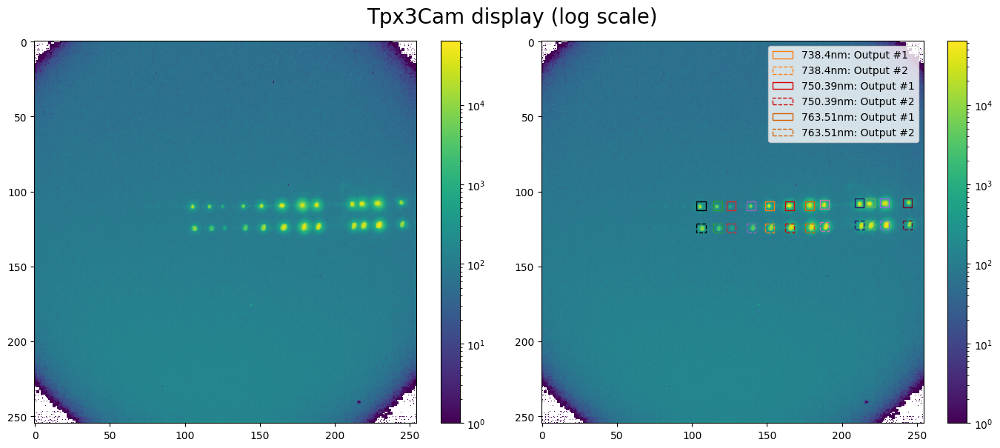

In [11]:
hist, xedges, yedges = np.histogram2d(MZI_df_preview['#Col'], MZI_df_preview['#Row'], bins=[255, 255])

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle("Tpx3Cam display (log scale)", fontsize=20)

im1 = ax1.imshow(hist, origin='upper', norm=matplotlib.colors.LogNorm())
colorbar1 = fig.colorbar(im1, ax=ax1)

im2 = ax2.imshow(hist, origin='upper', norm=matplotlib.colors.LogNorm())

for i, spot in spot_df.iterrows():
    if abs(spot['wavelength(nm)'] - 750) < 20.0:
        label = f"{spot['wavelength(nm)']}nm: Output #{spot['#output']}"
    else:
        label = None
    if spot['#output'] == 1:
        line_style = 'solid'
    elif spot['#output'] == 2:
        line_style = 'dashed'
    spot_patch = matplotlib.patches.Rectangle((spot['y_start'], spot['x_start']), spot['y_extent'], spot['x_extent'],
                    linewidth=1, edgecolor=spot['display_color'], facecolor='none', label=label, ls=line_style)
    ax2.add_patch(spot_patch)

colorbar2 = fig.colorbar(im2, ax=ax2)
ax2.legend()

#plt.subplots_adjust(wspace=0.2)
fig.tight_layout()
plt.show()

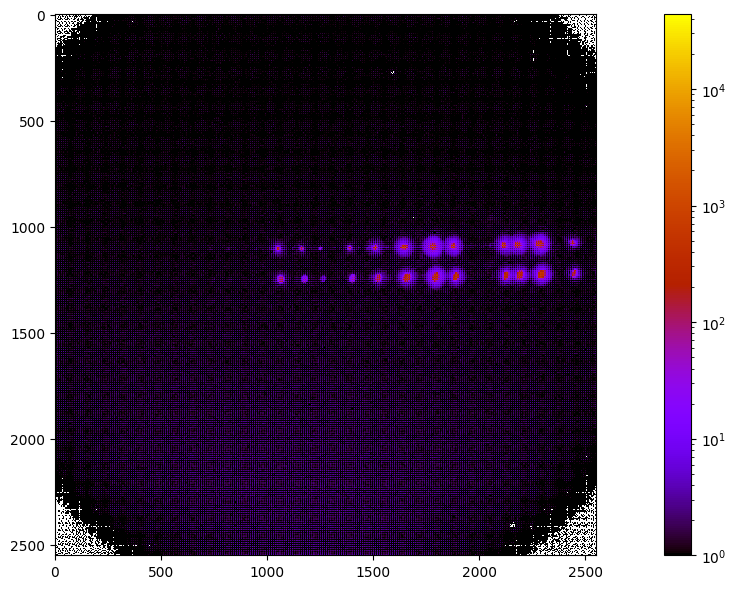

In [12]:
#above, but with centroiding and more bins (from the ability to resolve them)
hist, xedges, yedges = np.histogram2d(MZI_df_preview['#cent_X'], MZI_df_preview['#cent_Y'], bins=[2550, 2550])

fig, ax1 = plt.subplots(figsize=(14, 6))

im1 = ax1.imshow(hist, origin='upper', cmap='gnuplot', norm=matplotlib.colors.LogNorm())
colorbar1 = fig.colorbar(im1, ax=ax1)

#to show the angle of the wavelegnths axis
#ax1.plot(np.linspace(300,2500,3),np.ones(3)*1080)
#ax1.plot(np.linspace(300,2500,3),np.ones(3)*1220)
#

#plt.subplots_adjust(wspace=0.2)
fig.tight_layout()
plt.show()

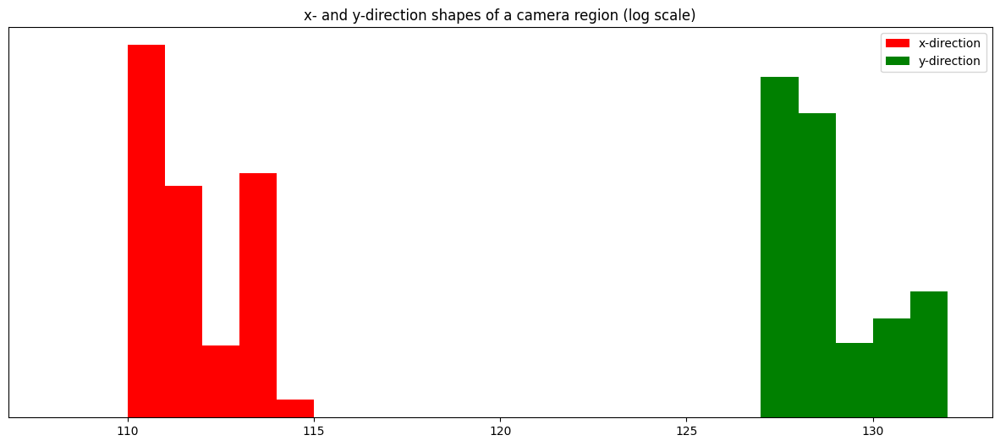

In [13]:
#generate spot shape of the above graphs
#x and y are the opposite of that you think they are here.

x_low, x_high, y_low, y_high = 109, 115, 126, 132 #make these numbers integers; they define the rectangular window considered

plot_hist = MZI_df_preview[(MZI_df_preview['#Row'] < y_high) & (MZI_df_preview['#Col'] > x_low) & (MZI_df_preview['#Col'] < x_high) & (MZI_df_preview['#Row'] > y_low)]
plot_hist_y = plot_hist['#Row']
plot_hist_x = plot_hist['#Col']

hx = np.histogram(plot_hist_x,bins=x_high-x_low)[0]
hy = np.histogram(plot_hist_y,bins=y_high-y_low)[0]

arbits_y = np.linspace(y_low,y_high,len(hy))
arbits_x = np.linspace(x_low,x_high,len(hx))

fig, ax = plt.subplots(figsize=(15,6))
ax.hist(plot_hist_x,bins=range(x_low-1,x_high+1),color='red',label='x-direction')
ax.hist(plot_hist_y,bins=range(y_low-1,y_high+1),color='green',label='y-direction')
#ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ax.set_yscale('log')
ax.set_title('x- and y-direction shapes of a camera region (log scale)')
ax.legend()
#would making this for the centroided data instead improve things?

### In the figure above spots are longer in wavelength the further right they are

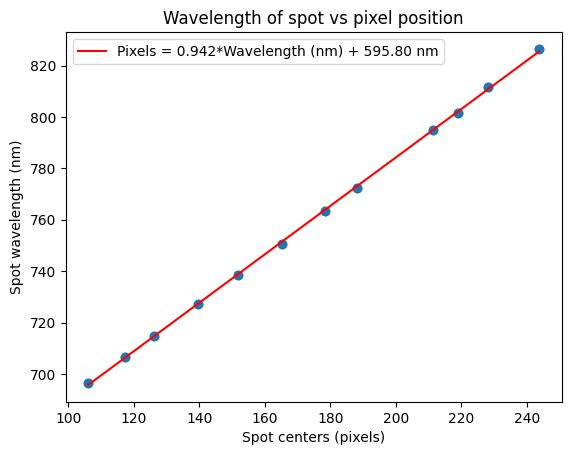

This spectrometer currently has a spectral resolution of 0.942 nm/pixel (1.062 pixel/nm)
This means with 255 total pixels a width of 240.20 nm can be fit on the detector, ranging from 595.80 nm - 836.00 nm.


In [14]:
#might be better to have two graphs, one for each bar.
spot_middle = (spot_df['y_start'] + spot_df['y_end']) / 2
plt.scatter(spot_middle, spot_df['wavelength(nm)'])

# Linear fitting
coefficients = np.polyfit(spot_middle, spot_df['wavelength(nm)'], 1)
m, b = coefficients
wavelength_linspace = np.linspace(min(spot_middle), max(spot_middle), 100)
pixel_vals = m * wavelength_linspace + b

plt.plot(wavelength_linspace, pixel_vals, color='red', label=f'Pixels = {m:.3f}*Wavelength (nm) + {b:.2f} nm')

plt.xlabel("Spot centers (pixels)")
plt.ylabel("Spot wavelength (nm)")
plt.title("Wavelength of spot vs pixel position")
plt.legend()
plt.show()



wavelength_per_pixel = m
print(f"This spectrometer currently has a spectral resolution of {wavelength_per_pixel:.3f} nm/pixel ({wavelength_per_pixel**-1:.3f} pixel/nm)")
print(f"This means with 255 total pixels a width of {wavelength_per_pixel*255:.2f} nm can be fit on the detector, ranging from {b:.2f} nm - {b+wavelength_per_pixel*255:.2f} nm.")

# Binning timestamps within regions into separate histograms (similar to data reading of SPADs) [we have]

### The code below should only need to be run one time when data is first collected, .pkl files should be created after to store all histograms to avoid this time consuming process again

In [15]:
#exact same as above, just switching cols and rows
chunk_size = 10000000 # Defines how many entries of the csv will be read into memory at one time

# Adding column named hist_vals filled with np.zeros(nbins)
hist_vals = [np.zeros(nbins) for _ in range(spot_df.shape[0])]

with pd.read_csv(cent_csv, usecols=['#Col', '#Row', '#ToA'], chunksize=chunk_size) as reader:
    for chunk in reader:
        # Extract timestamps within specified regions defined above within the current chunk of the file
        for i, spot in spot_df.iterrows():
            spot_timestamps = chunk[
                (spot['x_start'] <= chunk['#Col']) & (chunk['#Col'] <= spot['x_end']) &
                (spot['y_start'] <= chunk['#Row']) & (chunk['#Row'] <= spot['y_end'])]['#ToA']
            
            # Aggregating all timestamps for spot within corresponding hist_vals list
            hist_vals[i] += np.histogram(spot_timestamps, bins=hist_bins)[0]
            
        # Creating display for where you are in file
        last_timestamp = chunk.iloc[-1]
        rt = last_timestamp['#ToA'] * total_time / (end_time - start_time)
        
        clear_output(wait=True)
        print(f"Current position in csv: {rt} {time_div_label}")
        
spot_df['hist_vals'] = hist_vals
spot_df

Current position in csv: 90.86268825179239 sec


,wavelength(nm),#output,x_start,x_end,x_extent,y_start,y_end,y_extent,display_color,hist_vals
0,696.54,1,106.5,112.5,6,103.1,109.1,6,#000000,"[46.0, 44.0, 51.0, 56.0, 26.0, 37.0, 42.0, 46...."
1,696.54,2,121.5,127.5,6,103.1,109.1,6,#000000,"[273.0, 271.0, 323.0, 277.0, 266.0, 310.0, 288..."
2,706.72,1,106.5,112.5,6,114.3,120.3,6,#2ca02c,"[108.0, 98.0, 119.0, 120.0, 106.0, 128.0, 117...."
3,706.72,2,121.5,127.5,6,114.3,120.3,6,#2ca02c,"[14.0, 23.0, 19.0, 11.0, 19.0, 16.0, 14.0, 14...."
4,714.70,1,106.5,112.5,6,123.1,129.1,6,#d62728,"[24.0, 30.0, 21.0, 32.0, 14.0, 27.0, 26.0, 20...."
5,714.70,2,121.5,127.5,6,123.1,129.1,6,#d62728,"[7.0, 10.0, 9.0, 18.0, 15.0, 14.0, 16.0, 8.0, ..."
6,727.29,1,106.5,112.5,6,136.6,142.6,6,#9467bd,"[110.0, 104.0, 133.0, 124.0, 114.0, 109.0, 98...."
7,727.29,2,121.5,127.5,6,136.6,142.6,6,#9467bd,"[35.0, 33.0, 42.0, 23.0, 41.0, 44.0, 42.0, 42...."
8,738.40,1,106.5,112.5,6,148.7,154.7,6,#ff7f0e,"[190.0, 167.0, 178.0, 199.0, 207.0, 207.0, 203..."
9,738.40,2,121.5,127.5,6,148.7,154.7,6,#ff7f0e,"[428.0, 446.0, 441.0, 417.0, 386.0, 374.0, 384..."


In [16]:
# Saving histograms to pickle files to not have to go through process of aggregation again
#to change the file name to save data for multiple measurements,
for i, spot in spot_df.iterrows():
    file_name = f"hist_finbin_Ar1s_{spot['wavelength(nm)']}_{spot['#output']}.pkl"
    with open(file_name, 'wb') as f:
        pickle.dump(spot_df.loc[i, 'hist_vals'], f)

## Animation of data collection (Optional: use for troubleshooting, presentation, or fun :D) Currently does not animate over full csv for some unknown reason :( (luckily, it doesn't really have to)

In [1]:
#I should try my hand at an alternate method of animation, if it ends up mattering
chunk_size = 1000000 # Defines how many entries of the csv will be displayed at one time

# Initializing plot to be updated
fig, ax = plt.subplots(figsize=(8, 6))
hist, xedges, yedges = np.histogram2d(MZI_df_preview['#Col'], MZI_df_preview['#Row'], bins=255)

im = plt.imshow(hist, origin='upper', norm=matplotlib.colors.LogNorm())
colorbar = plt.colorbar(im)
ax.set_title(f'Experiment Time: 0.00 {time_div_label}')

def animate(chunk):
    last_timestamp = chunk.iloc[-1]
    rt = last_timestamp['#ToA'] * total_time / (end_time - start_time)
    hist, xedges, yedges = np.histogram2d(chunk['#Col'], chunk['#Row'], bins=255)
    im.set_data(hist)
    ax.set_title(f'Experiment Time: {rt:.2f} {time_div_label}')
    
    clear_output(wait=True)
    print(f"Current frame: {rt} {time_div_label}")

def chunk_generator():
    with pd.read_csv(cent_csv, usecols=['#Col', '#Row', '#ToA'], chunksize=chunk_size) as reader:
        for chunk in reader:
            yield chunk
            
animation = FuncAnimation(fig, animate, frames=chunk_generator, blit=False)
plt.close()

#my computer doesn't know what mp4s are apparently
#animation = FuncAnimation(fig, animate, frames=chunk_generator, blit=False)
#plt.close()

animation_file = "MZI_animation.gif"  # Specify the desired location here
animation.save(animation_file)

# Display a message indicating where the animation file is saved
print("Animation saved as:", animation_file)

NameError: name 'plt' is not defined

# Graphing created histograms

In [17]:
# Loading previously made hist_val files into current notebook kernel
hist_vals = []
for i, spot in spot_df.iterrows():
    file_name = f"hist_finbin_Ar1s_{spot['wavelength(nm)']}_{spot['#output']}.pkl"
    with open(file_name, 'rb') as f:
        hist_vals.append(pickle.load(f))
        
spot_df['hist_vals'] = hist_vals

In [18]:
nominal_wls = [696.54, 706.72, 714.7, 727.29, 738.4, 750.39, 763.51, 772.38, 794.82, 801.48, 811.53, 826.45]
#surely i can just use the dataframe slice from before instead of this

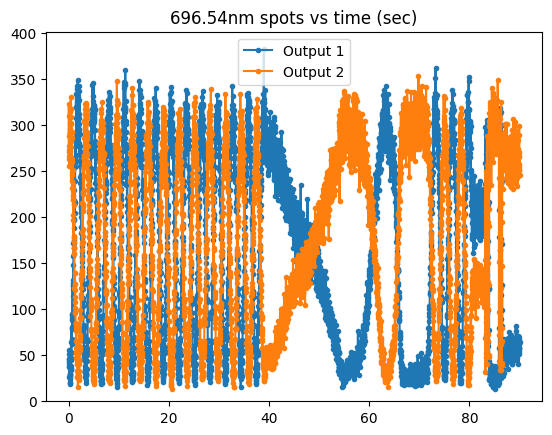

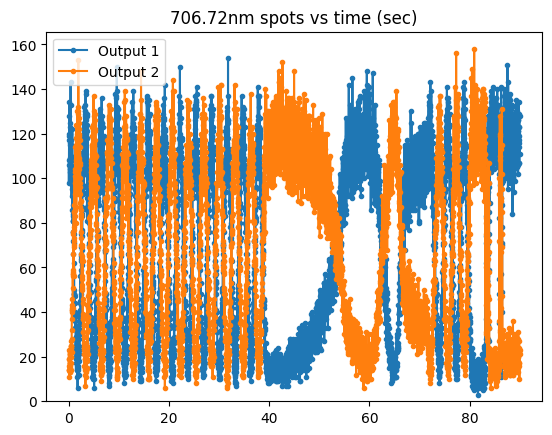

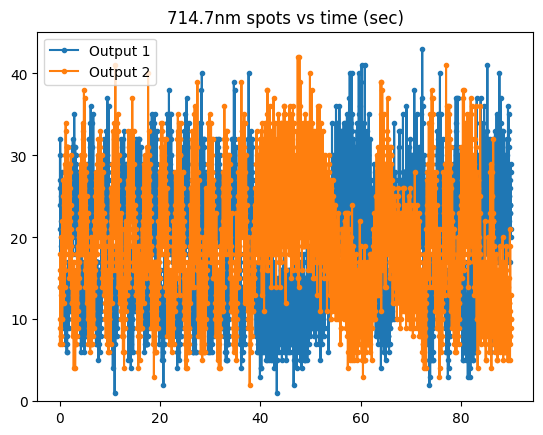

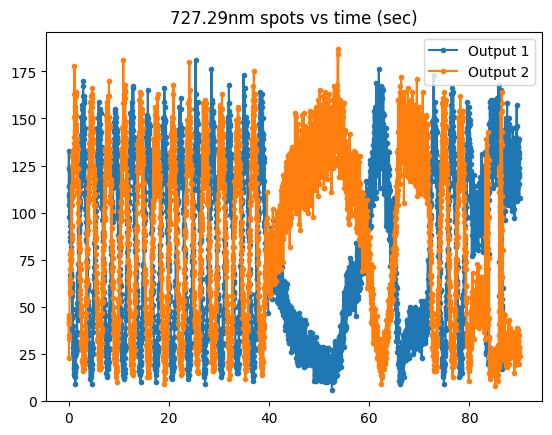

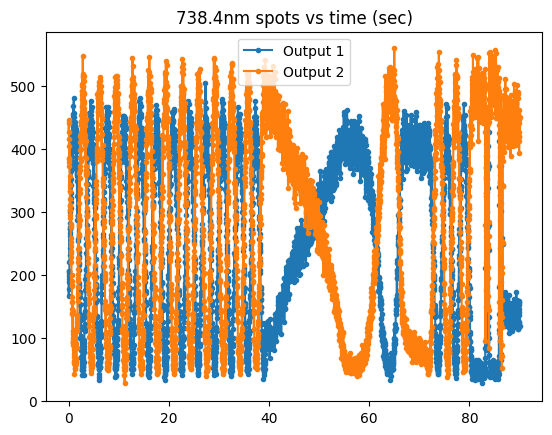

...

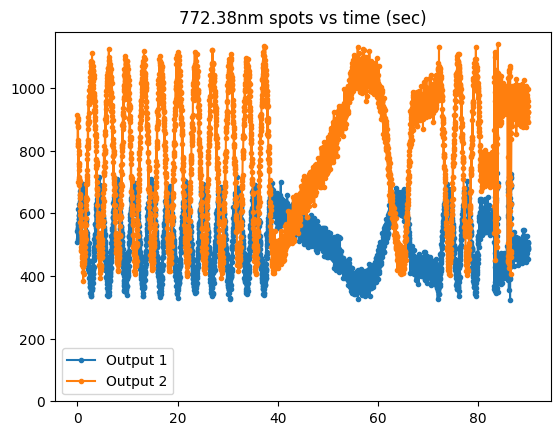

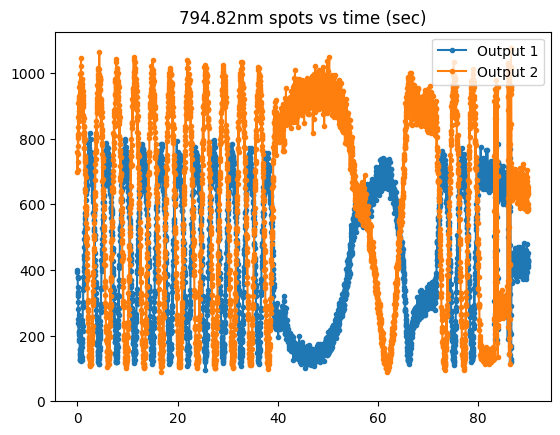

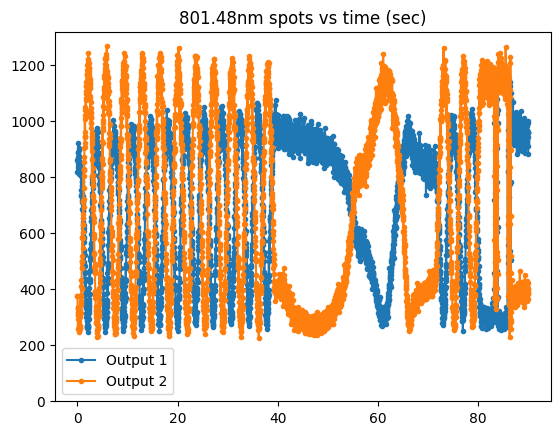

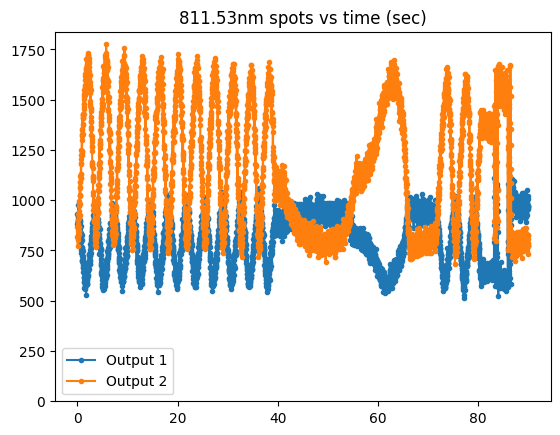

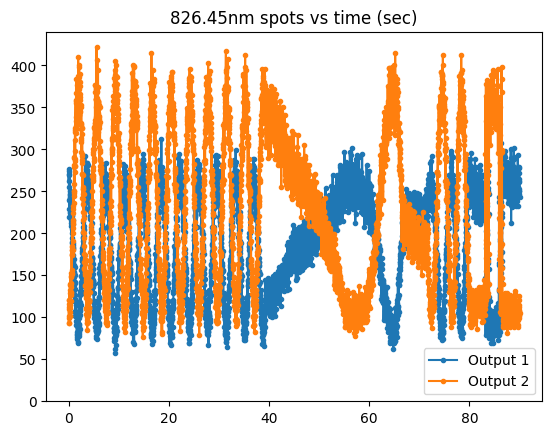

In [19]:
for i, spot in spot_df.iloc[::2].iterrows():
    output_1 = spot_df.iloc[i]
    output_2 = spot_df.iloc[i+1]

    if i == 1:
        print(output_1['hist_vals'])
    
    plt.plot(bin_centers_rt, output_1['hist_vals'], marker='.', label=f"Output {output_1['#output']}")
    plt.plot(bin_centers_rt, output_2['hist_vals'], marker='.', label=f"Output {output_2['#output']}")

    plt.ylim(bottom=0)
    
    plt.title(f"{spot['wavelength(nm)']}nm spots vs time ({time_div_label})")
    plt.legend()
    plt.savefig(f'signal_image_{nominal_wls[i//2]}_nm.png')
    plt.show()

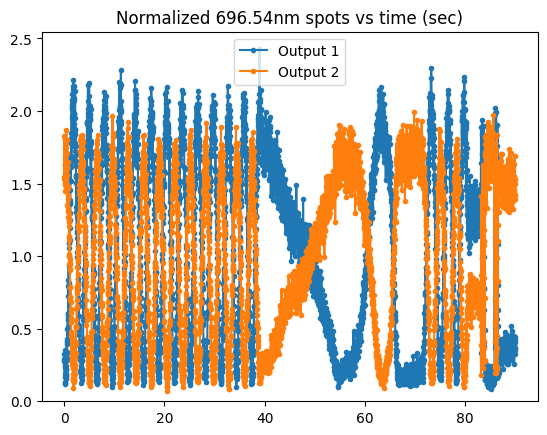

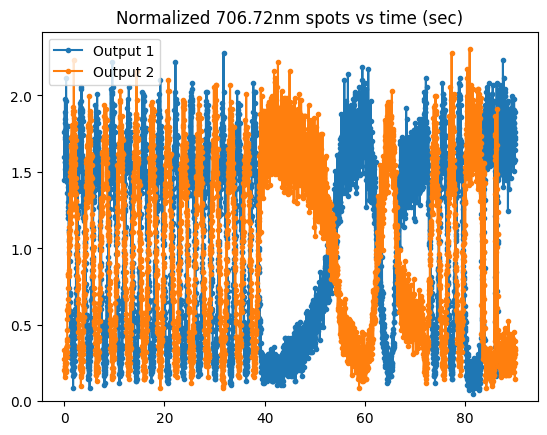

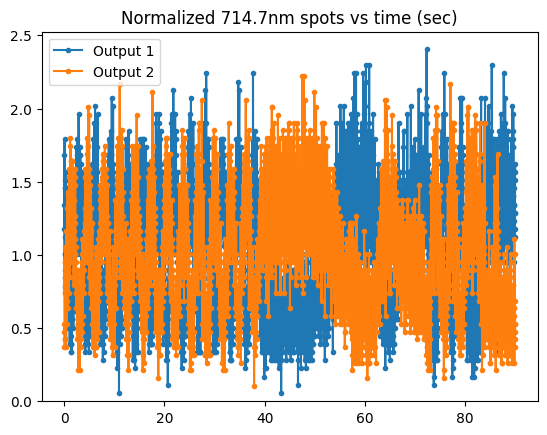

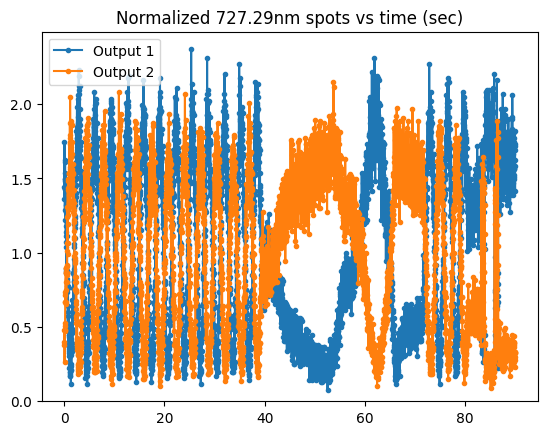

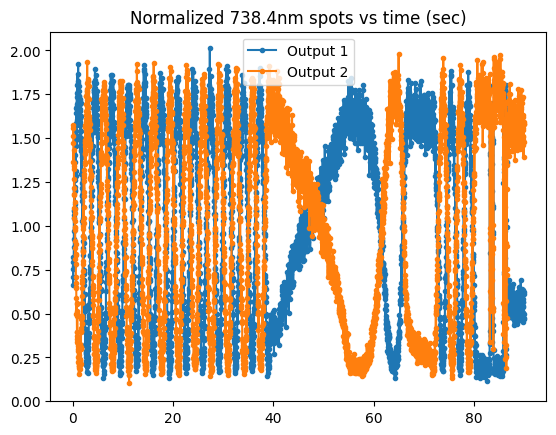

...

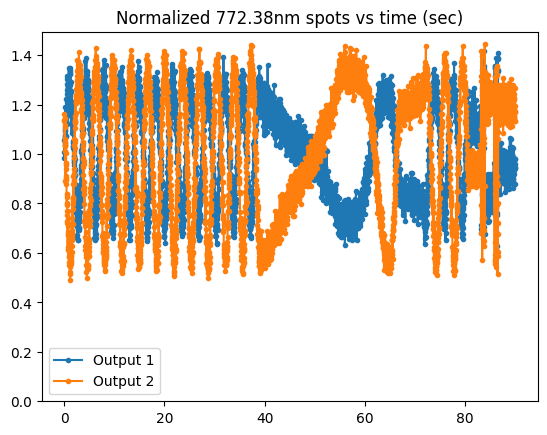

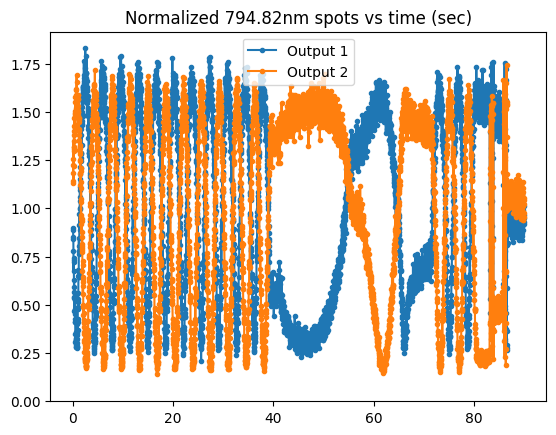

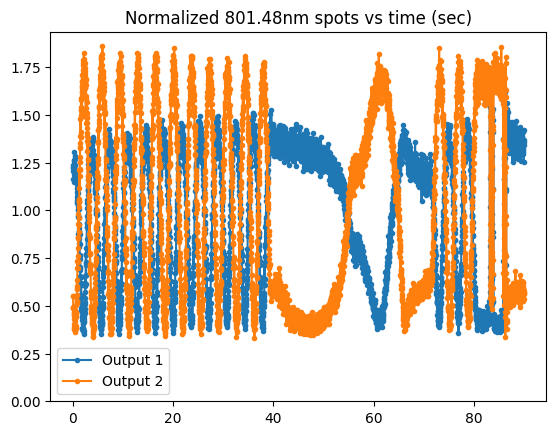

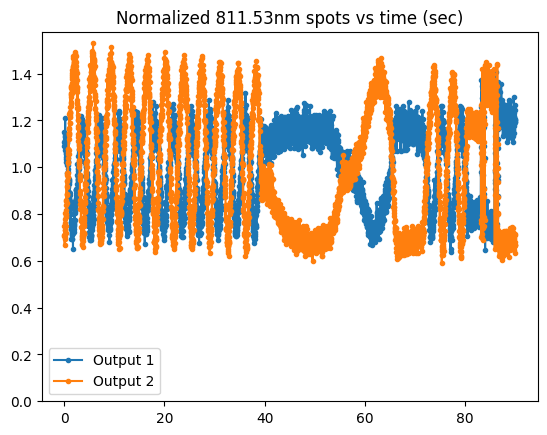

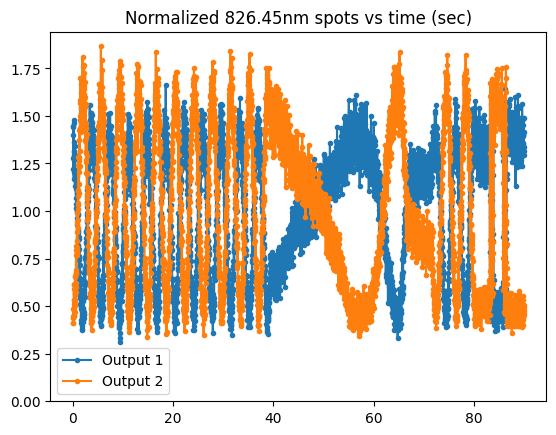

In [20]:
for i, spot in spot_df.iloc[::2].iterrows():
    output_1 = spot_df.iloc[i]
    output_2 = spot_df.iloc[i+1]
    
    plt.plot(bin_centers_rt, output_1['hist_vals'] / np.average(output_1['hist_vals']), marker='.', 
             label=f"Output {output_1['#output']}")
    plt.plot(bin_centers_rt, output_2['hist_vals'] / np.average(output_2['hist_vals']), marker='.', 
             label=f"Output {output_2['#output']}")

    plt.ylim(bottom=0)
    #plt.xlim(0, 60)
    
    plt.title(f"Normalized {spot['wavelength(nm)']}nm spots vs time ({time_div_label})")
    plt.legend()
    plt.show()

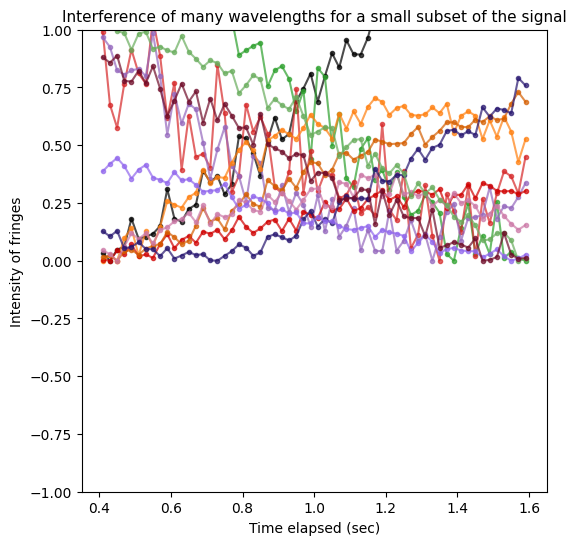

In [21]:
#CURRENTLY THIS PLOTS THE GRAPHS MINUS THEIR BOTTOM VALUE

fig, ax = plt.subplots(figsize=(6, 6))
visibility_vals = []

iind = 20
find = 80

for i, spot in spot_df.iloc[::2].iterrows():
    output_1 = spot_df.iloc[i]
    output_2 = spot_df.iloc[i+1]
    
    spot_visibility = (output_1['hist_vals'] - output_2['hist_vals']) / (output_1['hist_vals'] + output_2['hist_vals'])
    visibility_vals.append(spot_visibility)
    visibility_vals.append(-spot_visibility) # Outputs 1 and 2 will get opposite visibility values
    
    plt.plot(bin_centers_rt[iind:find], spot_visibility[iind:find]-np.min(spot_visibility[iind:find]), marker='.', color=spot_df.loc[i, 'display_color'], 
             label=f"{spot['wavelength(nm)']}nm", alpha=0.7)

spot_df['vis_vals'] = visibility_vals
    
plt.ylim(-1, 1)
plt.xlabel(f"Time elapsed ({time_div_label})")
plt.ylabel("Intensity of fringes")
plt.title(f"Interference of many wavelengths for a small subset of the signal", fontsize=11)
#plt.legend()
plt.show()

# Fourier analysis

## Functions used for finding theoretical interference pattern frequencies

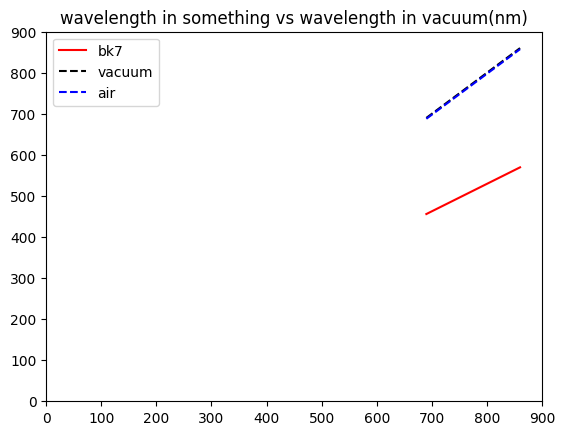

In [22]:
# https://en.wikipedia.org/wiki/Sellmeier_equation
def sellemeier_bk7(wavelength): # Measured in nm
    return np.sqrt(1 + 1.03961212*wavelength**2/(wavelength**2-6.00069867e3) + 0.231792344*wavelength**2/(wavelength**2-2.00179144e4) + 1.01046945*wavelength**2/(wavelength**2-1.03560653e8))

#shows the effective wavelengths of light in air, vacuum, anc bk7 glass as a function of wavelength
fig, ax = plt.subplots()
x = np.linspace(690,860,1000)
ax.plot(x,x/sellemeier_bk7(x),'r-',label='bk7')
ax.plot(x,x,'k--',label='vacuum')
ax.plot(x,x/1.003,'b--',label='air')
ax.set_xlim(0,900)
ax.set_ylim(0,900)
ax.set_title('wavelength in something vs wavelength in vacuum(nm)')
ax.legend()

In [23]:
#save input binned data. OPTIONAL
with open('input_bin_centers.dat','w') as rfile:
    for x in bin_centers_rt[:-1]:
        rfile.write(str(x))
        rfile.write('\n')
    rfile.write(str(bin_centers_rt[-1]))

In [24]:
#save signal binned data. OPTIONAL
for i, spot in spot_df.iloc[::2].iterrows():
    output_1 = spot_df.iloc[i]
    output_2 = spot_df.iloc[i+1]
    
    with open(f'signal_o1_{nominal_wls[i//2]}_nm.dat','w') as file1:
        for x in output_1['hist_vals'][:-1]:
            file1.write(str(x))
            file1.write('\n')
        file1.write(str(output_1['hist_vals'][-1]))
            
    with open(f'signal_o2_{nominal_wls[i//2]}_nm.dat','w') as file2:
        for x in output_2['hist_vals'][:-1]:
            file2.write(str(x))
            file2.write('\n')
        file2.write(str(output_2['hist_vals'][-1]))

In [25]:
# Only works if motor code is still giving a steps command of value 32 
# (32 steps corresponds to a motor movement of 2.5 microns, scale the 2.5 in the fxn below to the correct value if needed)
# Returns in inverse units of time divisions being used for display units
def find_int_freq(wavelength, motorMovementsPerExposure=motorMovementsPerExposure, exposure_time=exposure_time, time_div_val=time_div_val):
    return(1000*2.5*motorMovementsPerExposure*np.tan(np.radians(1))*(sellemeier_bk7(wavelength)-1) / (wavelength*exposure_time)) * time_div_val

In [26]:
find_int_freq(785)

np.float64(0.2841059550623665)

## Defining limits on what gets fourier analyzed

In [29]:
# Times you want the modeling to start and end at (measured in minutes, seconds, etc.)
#since some of your model might be junk
model_start = 0.0
model_end = 90

In [30]:
# Finding closest index in bin_centers_rt array to above values
start_index = np.argmin(np.abs(bin_centers_rt-model_start))
end_index = np.argmin(np.abs(bin_centers_rt-model_end))
model_size = end_index - start_index

print(f"The model will start at index {start_index} and end at {end_index} within the value arrays.")

The model will start at index 0 and end at 4499 within the value arrays.


In [31]:
# Creating fft values using np.fft.fft
frequencies = np.fft.fftfreq(model_size, bin_centers_rt[1] - bin_centers_rt[0])
fft_vals = []
fft_vis_vals = []

for i, spot in spot_df.iterrows():
    spot_fft = np.fft.fft(spot['hist_vals'][start_index:end_index])
    fft_vals.append(spot_fft)
    
    if i % 2 == 0:
        visibility_fft = np.fft.fft(spot['vis_vals'][start_index:end_index])
        fft_vis_vals.append(visibility_fft)
        fft_vis_vals.append(visibility_fft)
        
spot_df['fft_vals'] = fft_vals
spot_df['fft_vis_vals'] = fft_vis_vals

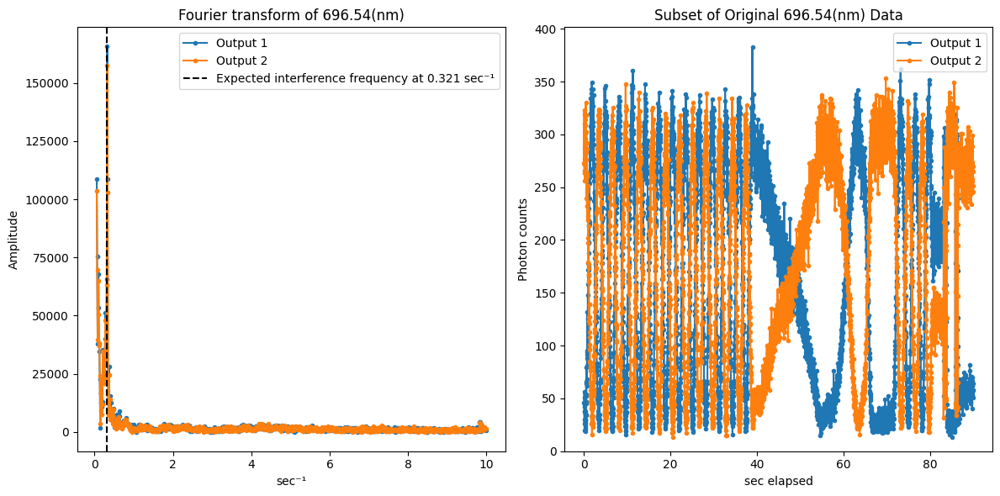

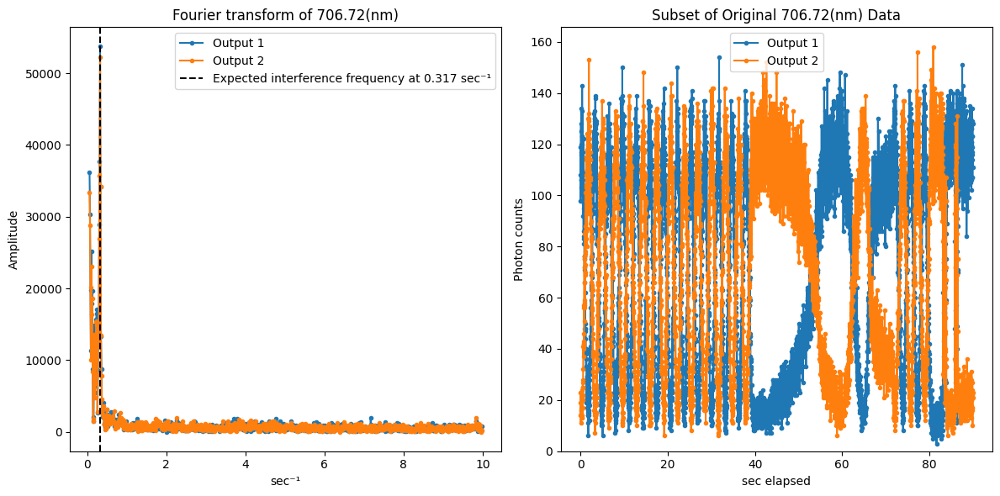

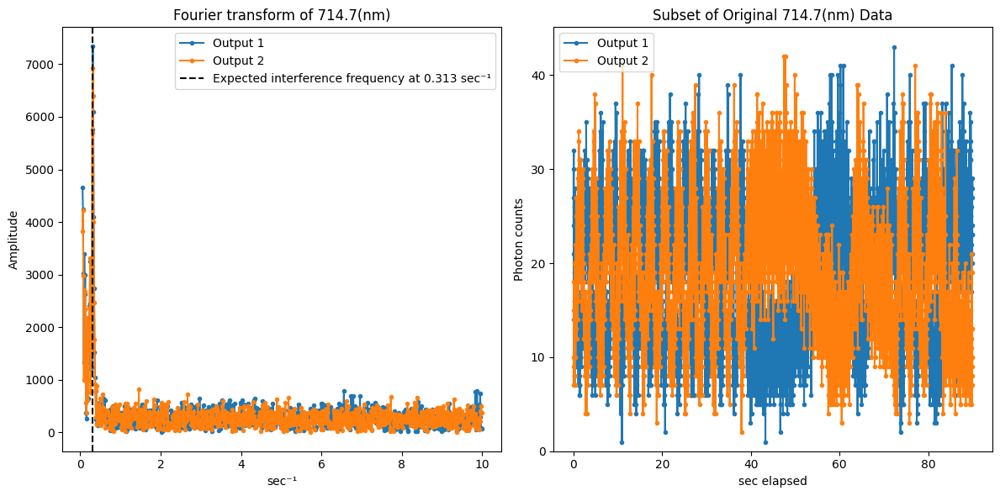

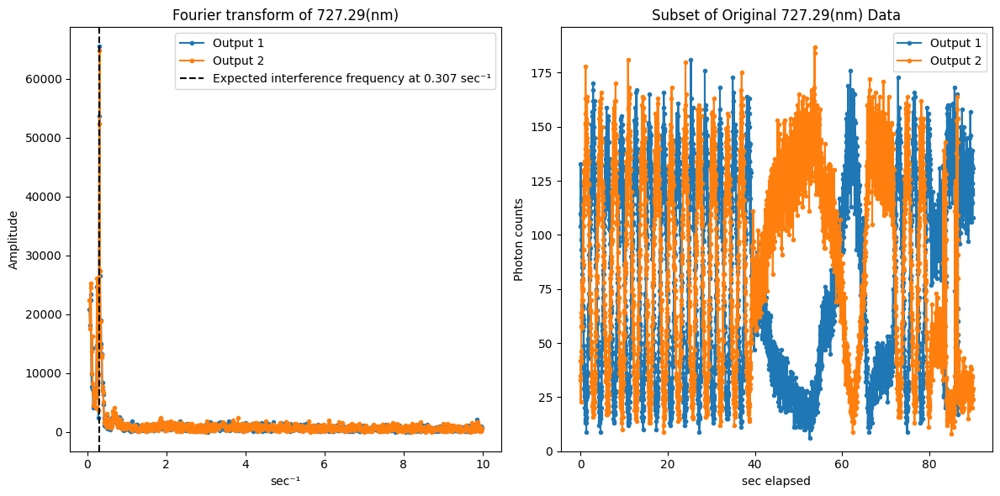

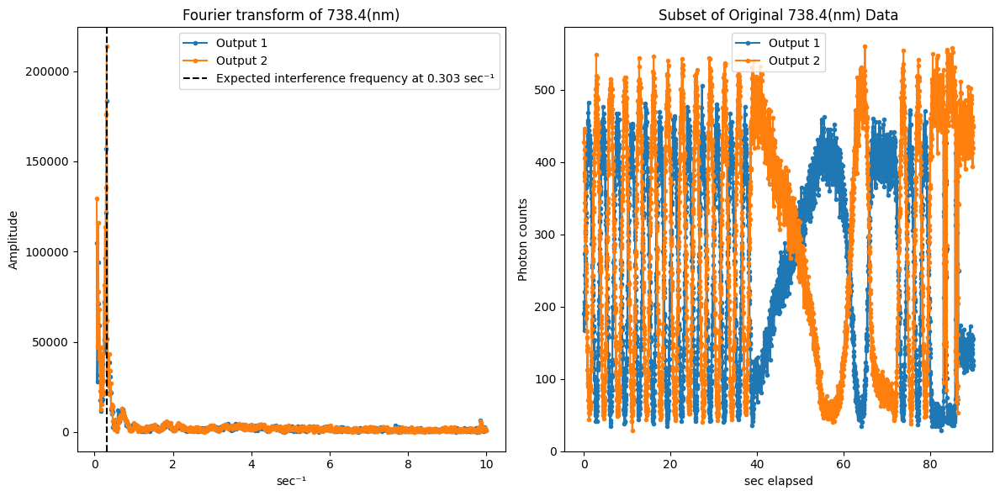

...

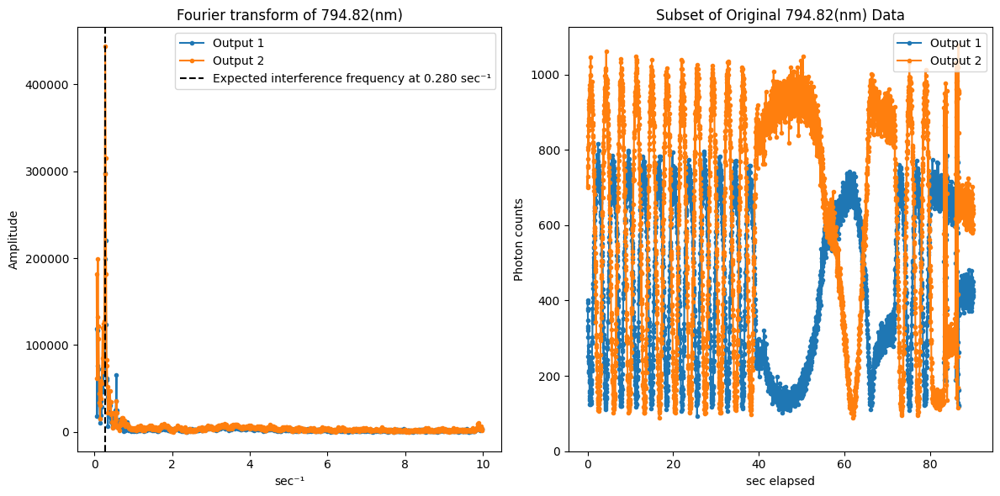

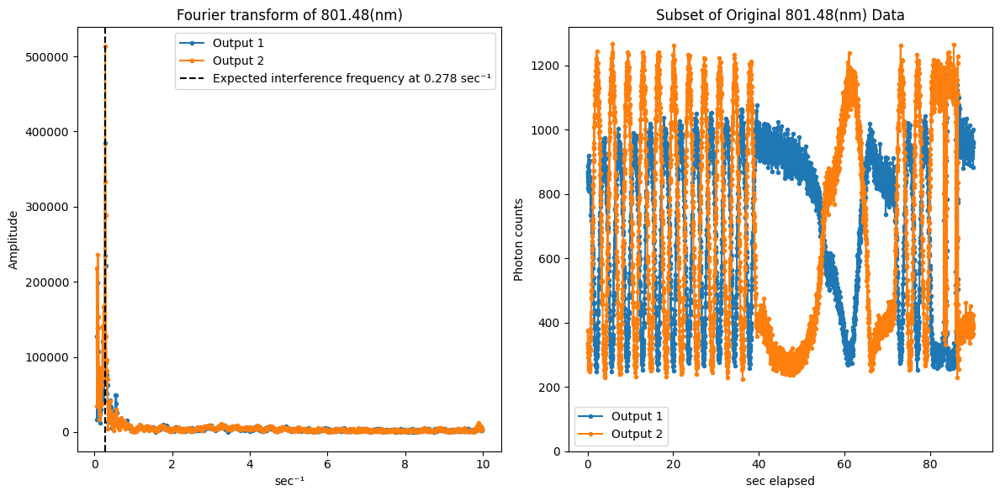

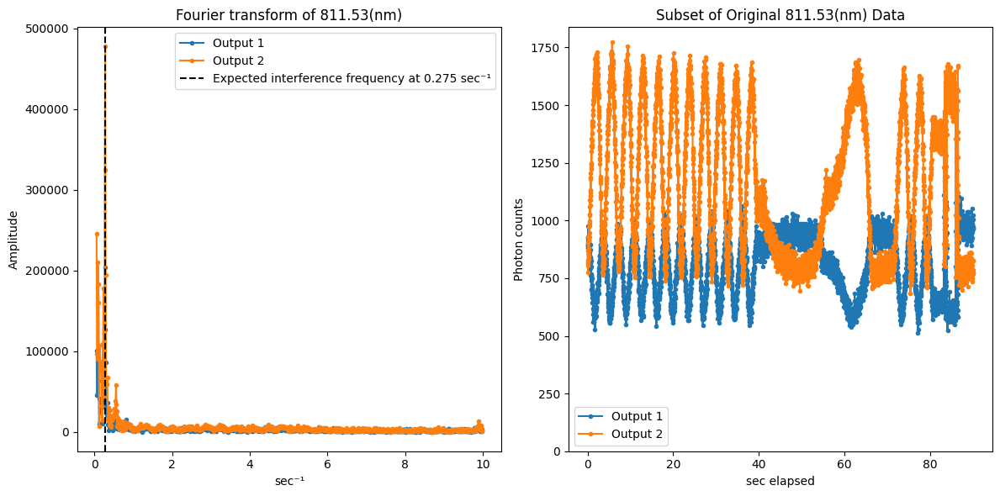

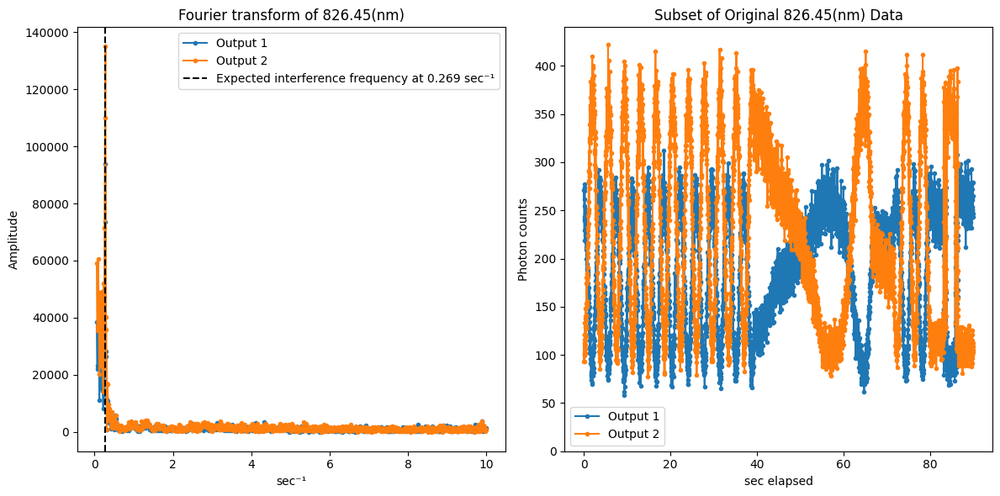

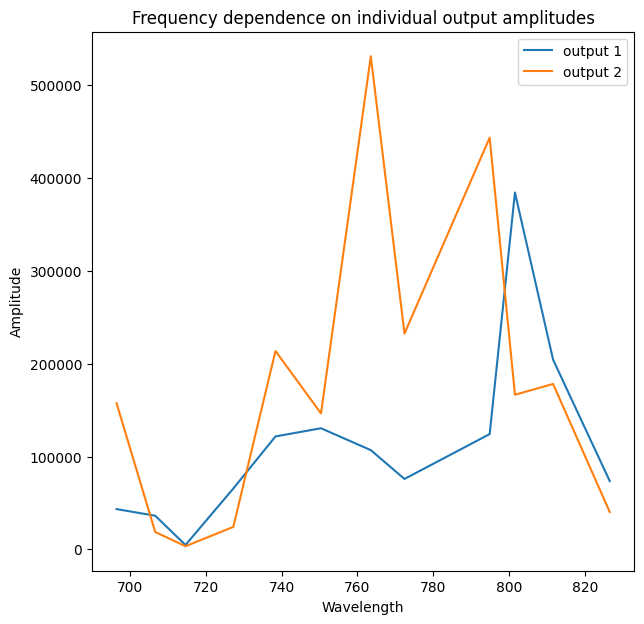

In [32]:
o1_fourier_peaks = []
o2_fourier_peaks = []
for i, spot in spot_df.iloc[::2].iterrows():
    fft_fig = plt.figure(figsize = (12, 6))
    
    output_1 = spot_df.iloc[i]
    output_2 = spot_df.iloc[i+1]

    # Frequency domain
    plt.subplot(121)
    
    # Below plots the modulus of the fft values, and doesn't display points after the nyquist frequency (negative values)
    plt.plot(frequencies[5:model_size//5], np.abs(output_1['fft_vals'][5:model_size//5]), marker='.', label='Output 1')
    plt.plot(frequencies[5:model_size//5], np.abs(output_2['fft_vals'][5:model_size//5]), marker='.', label='Output 2')
    #indexed to ignore the 0-spike

    o1_fourier_peaks.append( np.abs(output_1['fft_vals'][ output_1['fft_vals'][5:model_size//2].argmax() + 5 ]) )
    o2_fourier_peaks.append( np.abs(output_2['fft_vals'][ output_2['fft_vals'][5:model_size//2].argmax() + 5 ]) )

    int_freq = find_int_freq(spot['wavelength(nm)'])
    plt.axvline(x=int_freq, color='Black', ls='--', label=f'Expected interference frequency at {int_freq:.3f} {time_div_label}⁻¹')

    plt.xlabel(f"{time_div_label}⁻¹")
    plt.ylabel("Amplitude")
    plt.title(f"Fourier transform of {output_1['wavelength(nm)']}(nm)")
    plt.legend()

    # Time domain from before being modeled
    #plt.subplot(122)
    #plt.plot(bin_centers_rt, output_1['hist_vals'], marker='.', label=f"Output {output_1['#output']}")
    #plt.plot(bin_centers_rt, output_2['hist_vals'], marker='.', label=f"Output {output_2['#output']}")

    plt.subplot(122) #for to see if there's anti- or *- correlation. must comment axvlines out
    plt.plot(bin_centers_rt, output_1['hist_vals'], marker='.', label=f"Output {output_1['#output']}")
    plt.plot(bin_centers_rt, output_2['hist_vals'], marker='.', label=f"Output {output_2['#output']}")

    #plt.axvline(x=model_start, color='Black', ls='--')
    #plt.axvline(x=model_end, color='Black', ls='--')

    plt.ylim(bottom=0)

    plt.title(f"Subset of Original {output_1['wavelength(nm)']}(nm) Data")
    plt.xlabel(f"{time_div_label} elapsed")
    plt.ylabel("Photon counts")
    plt.legend()

    fft_fig.tight_layout()
    plt.show()
fft_fig = plt.figure(figsize = (7, 7))
plt.subplot(111)
plt.plot(nominal_wls,o1_fourier_peaks,label='output 1')
plt.plot(nominal_wls,o2_fourier_peaks,label='output 2')
plt.xlabel('Wavelength')
plt.ylabel('Amplitude')
plt.title('Frequency dependence on individual output amplitudes')
plt.legend()

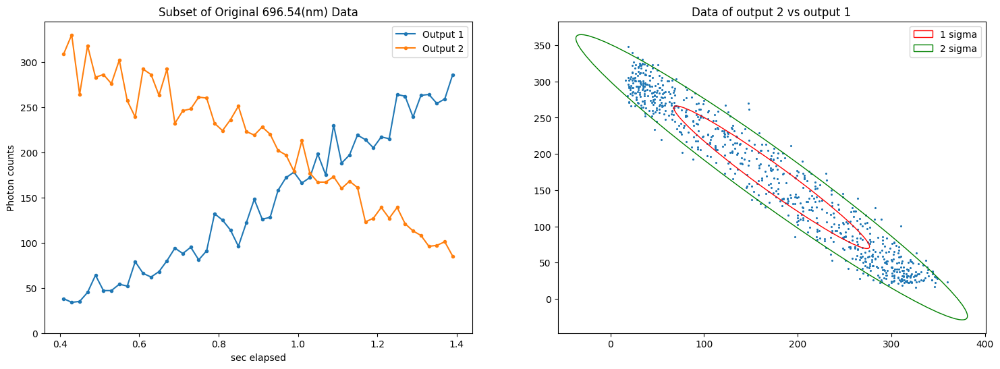

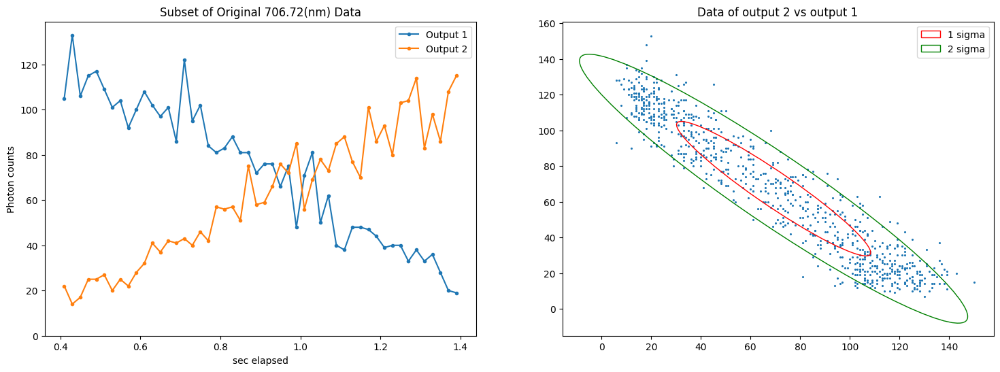

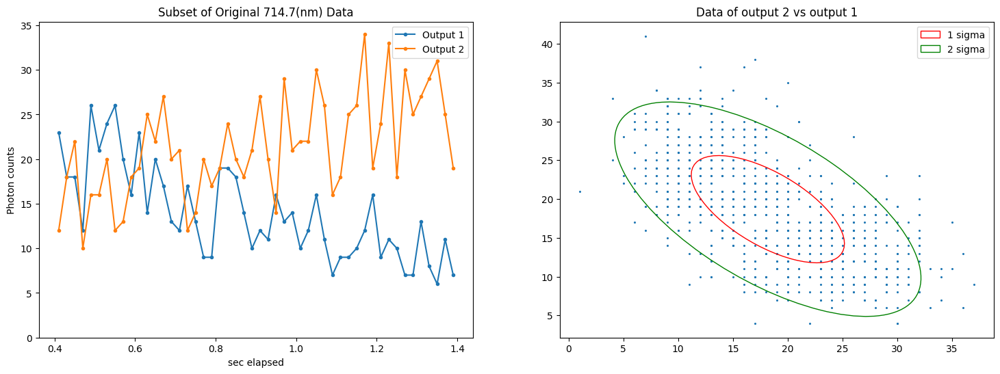

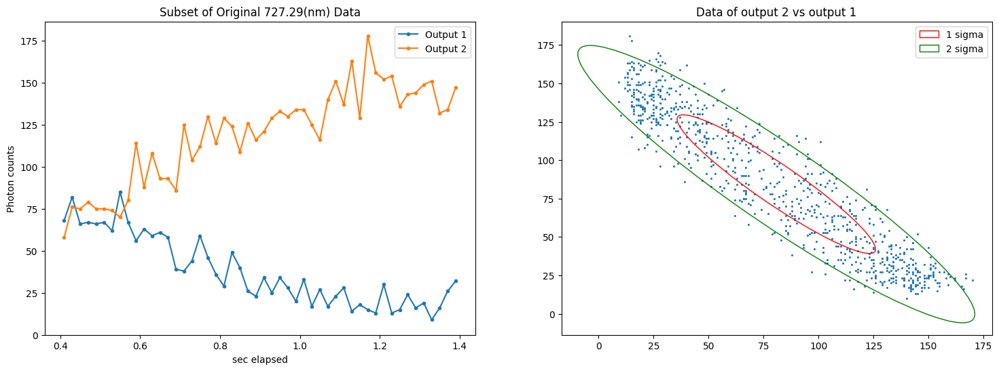

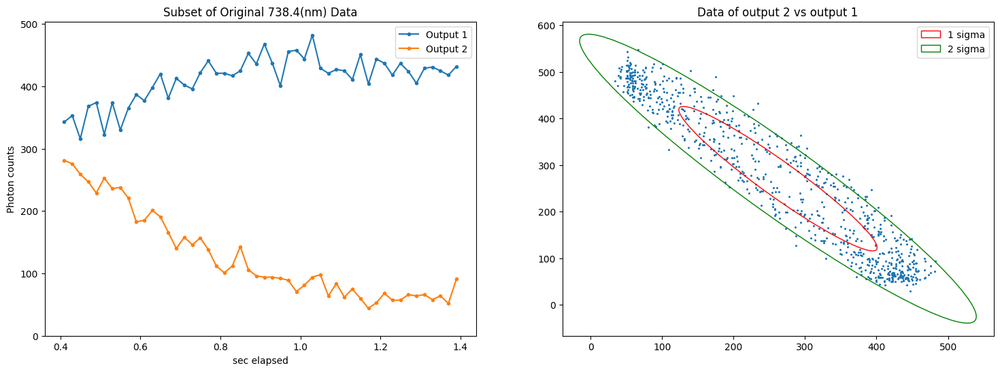

...

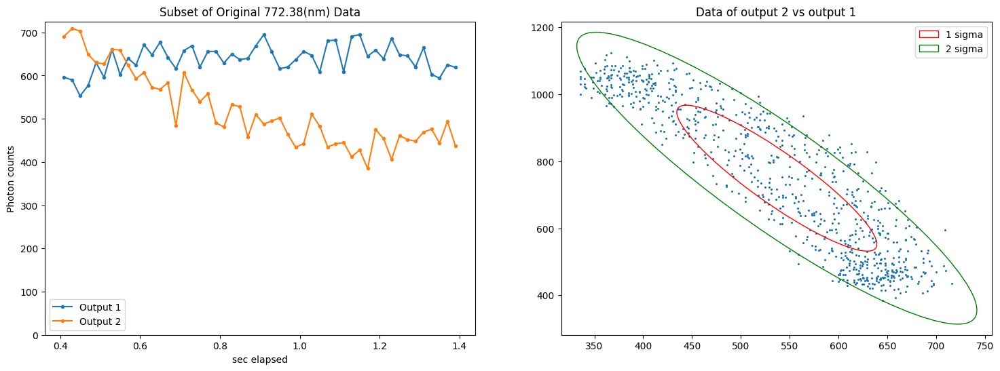

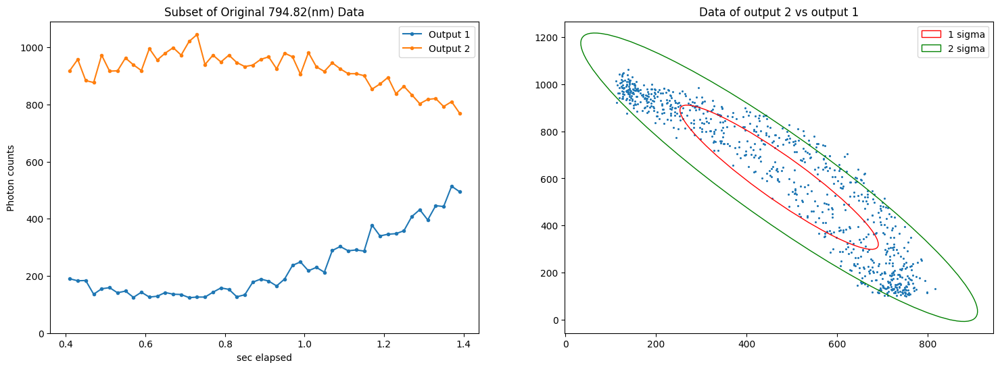

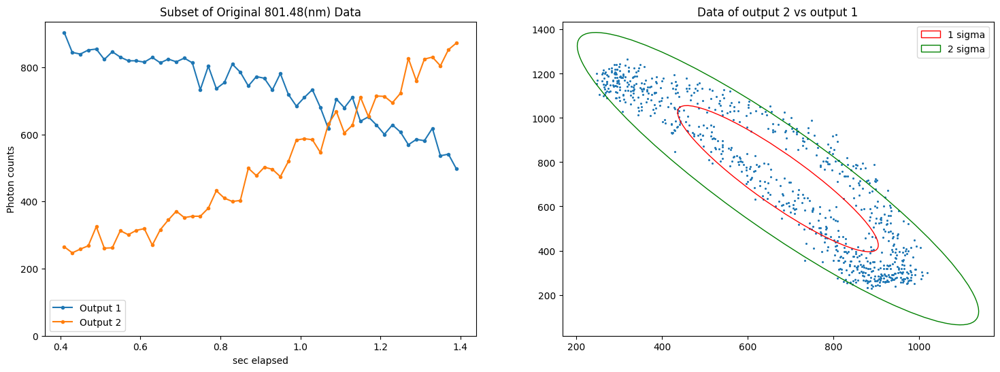

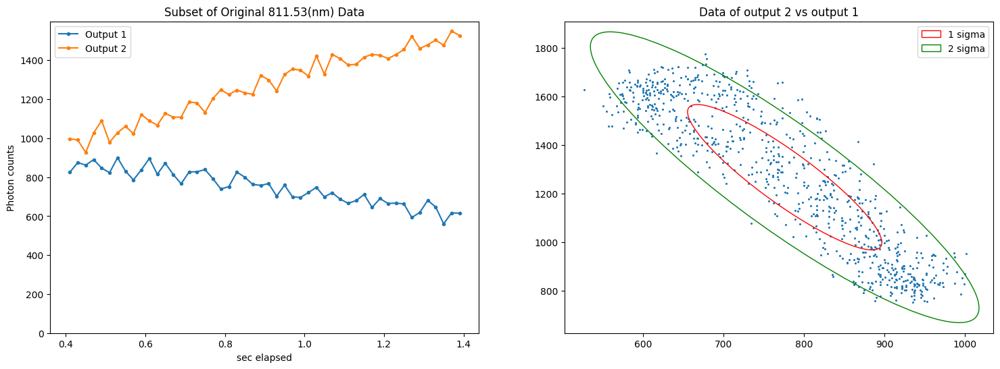

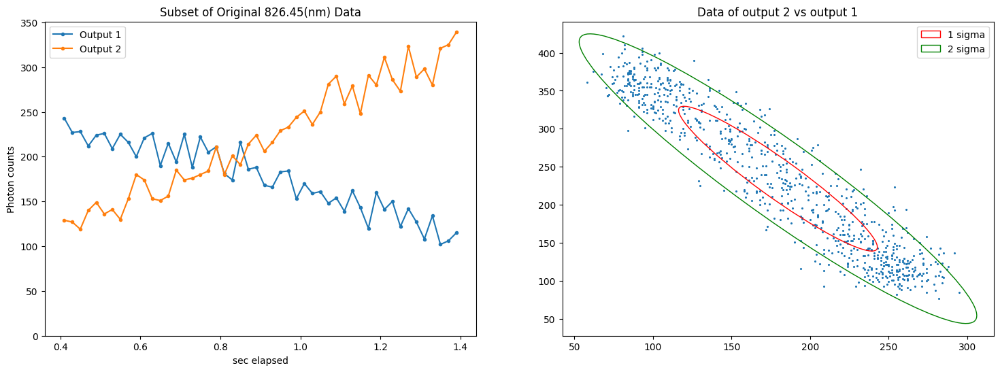

In [33]:
#this block is like the above code, but with an addition for seeing correlation on data.
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

def confidence_ellipse(x, y, ax, n_std=3.0, facecolor='none', **kwargs):
    """
    Create a plot of the covariance confidence ellipse of *x* and *y*.
    Parameters
    ----------
    x, y : array-like, shape (n, )
    Input data.
    ax : matplotlib.axes.Axes
    The Axes object to draw the ellipse into.
    n_std : float
    The number of standard deviations to determine the ellipse's radii.
    **kwargs
    Forwarded to `~matplotlib.patches.Ellipse`
    Returns
    -------
    matplotlib.patches.Ellipse
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")
    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensional dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2, facecolor=facecolor, **kwargs)
    # Calculating the standard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)
    # calculating the standard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)
    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)
    ellipse.set_transform(transf + ax.transData)
    ax.add_patch(ellipse)


for i, spot in spot_df.iloc[::2].iterrows():
    fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(18,6))
    
    output_1 = spot_df.iloc[i]
    output_2 = spot_df.iloc[i+1]

    #time domain
    ax1 = ax[0]
    ax1.plot(bin_centers_rt[20:70], output_1['hist_vals'][20:70], marker='.', label=f"Output {output_1['#output']}")
    ax1.plot(bin_centers_rt[20:70], output_2['hist_vals'][20:70], marker='.', label=f"Output {output_2['#output']}")
    ax1.set_ylim(bottom=0)
    ax1.set_title(f"Subset of Original {output_1['wavelength(nm)']}(nm) Data")
    ax1.set_xlabel(f"{time_div_label} elapsed")
    ax1.set_ylabel("Photon counts")
    ax1.legend()

    #correlation graph
    ST = 0 #to try to avoid artifacts created on startup or on pauses. the arrays are 800 long in total doing all of
    EN = 799
    #but there are a lot of potential artifacts that may contribute to correlations beyond the MZ ones; background light being one of them.
    #using all data start to finish definitely includes any universal background light spikes, and the pauses.
    ax2 = ax[1]
    ax2.scatter(output_1['hist_vals'][ST:EN],output_2['hist_vals'][ST:EN],s=1.5)
    ax2.set_title(f"Data of output 2 vs output 1")
    confidence_ellipse(output_1['hist_vals'][ST:EN], output_2['hist_vals'][ST:EN], ax2, n_std=1.0,edgecolor='red',label='1 sigma')
    confidence_ellipse(output_1['hist_vals'][ST:EN], output_2['hist_vals'][ST:EN], ax2, n_std=2.0,edgecolor='green',label='2 sigma')
    ax2.legend()


    #fig.tight_layout()
    #plt.show()

#instead of ellipses, a better uncertainty model could give an idea of what kind of nonlinearity is faced by the signal
#my guess is the same nonlinearity that produces these weird non-elliptical shapes also causes the fourier peaks at multiples of the primary frequency

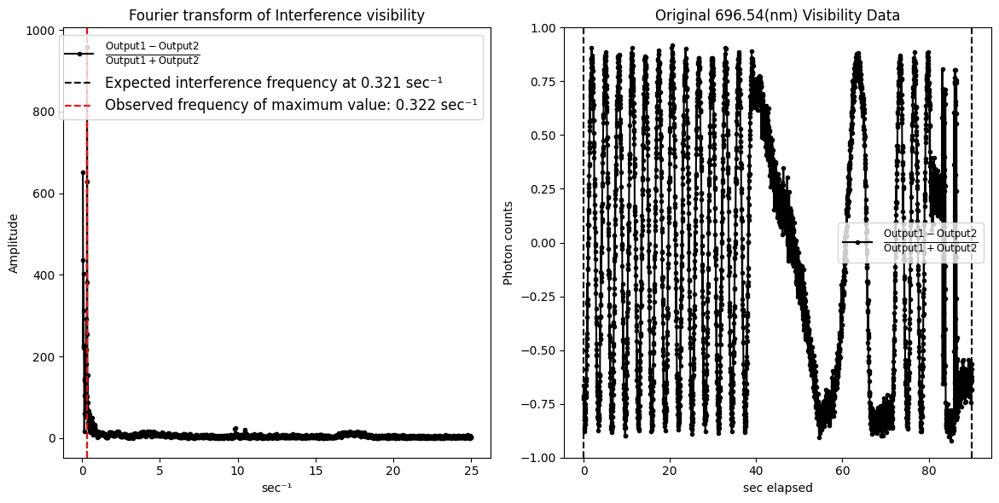

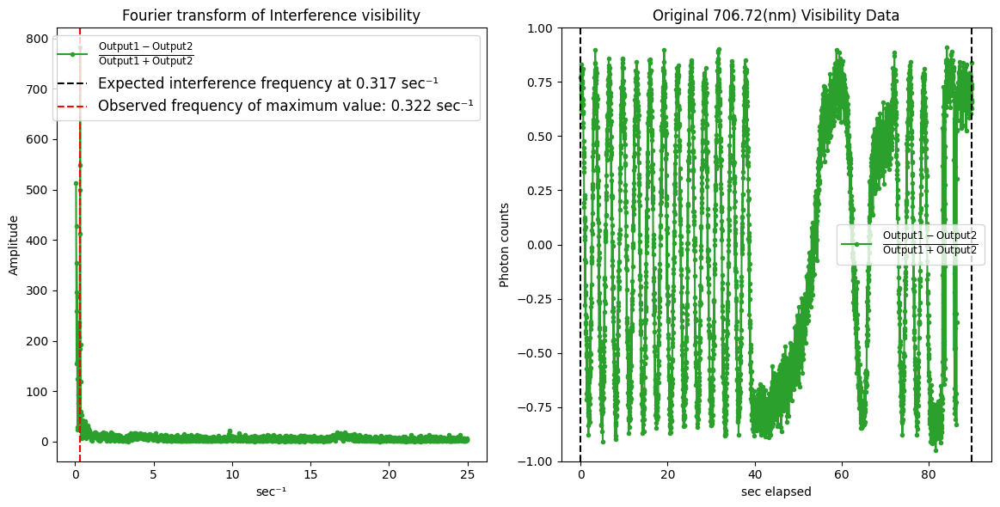

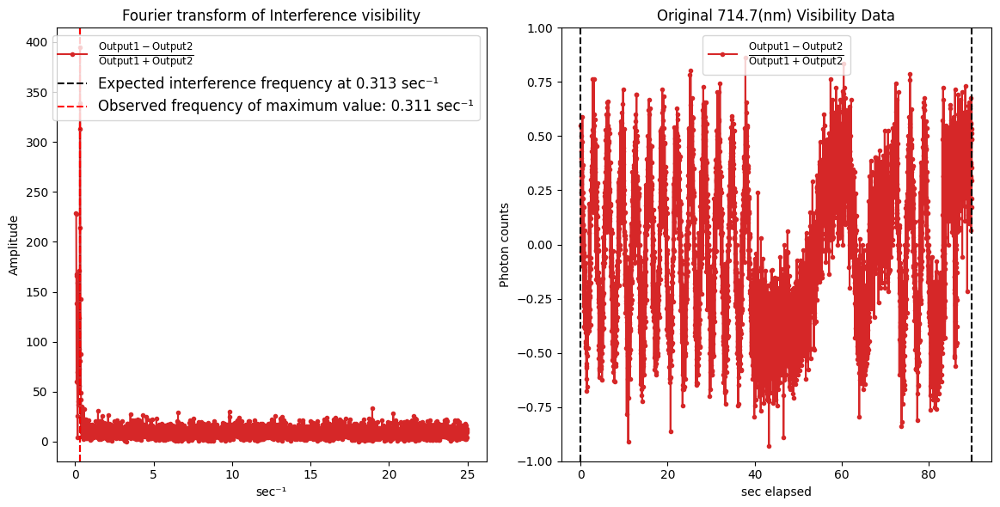

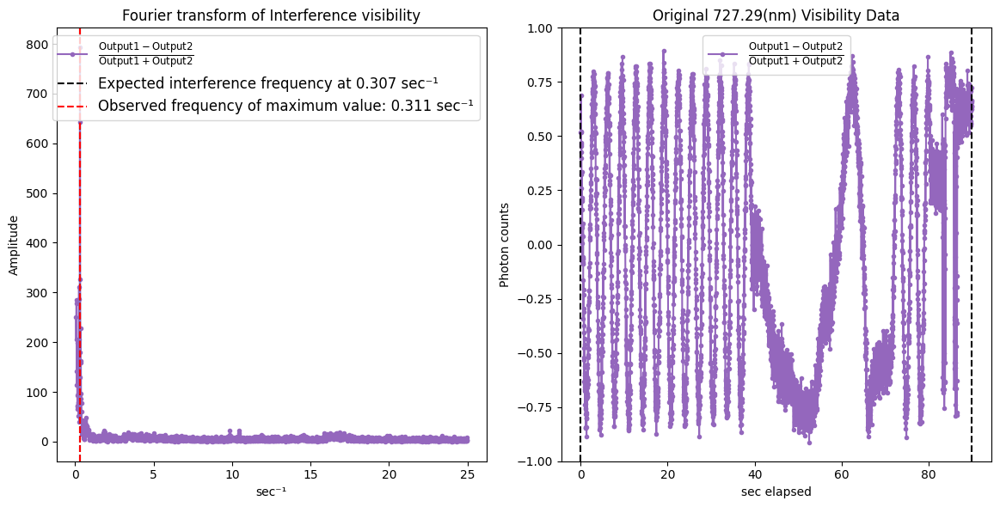

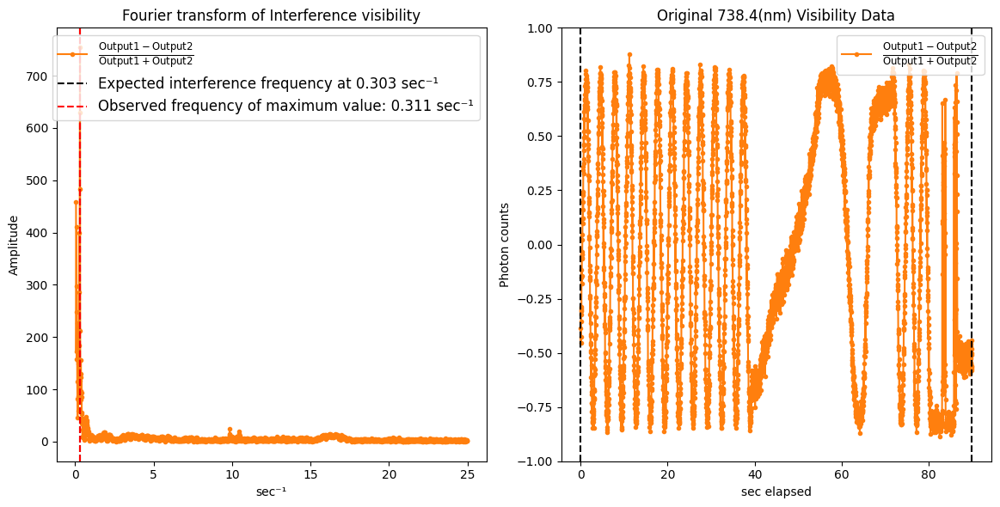

...

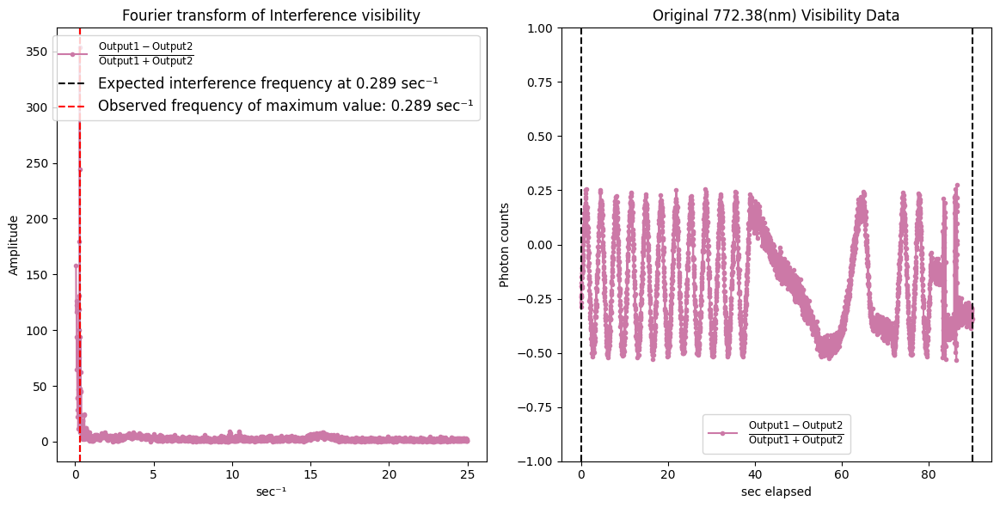

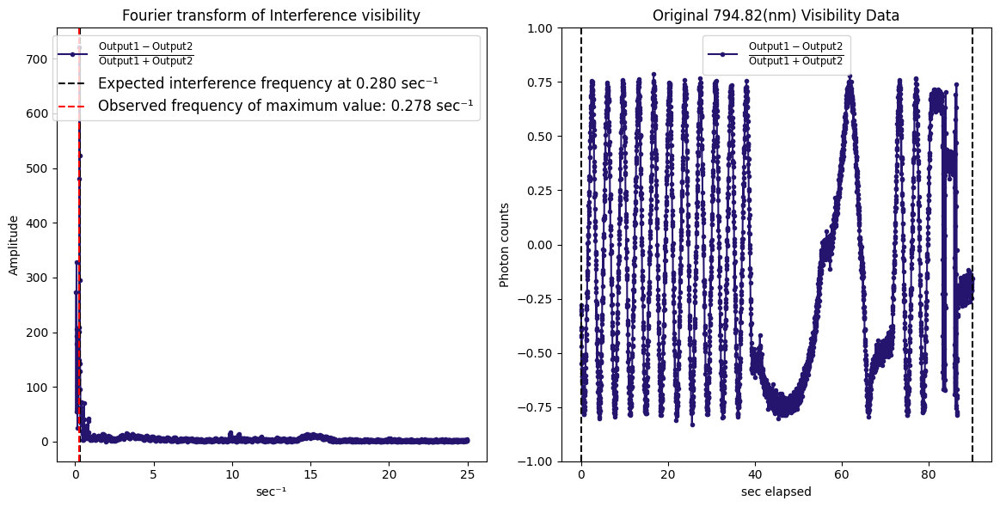

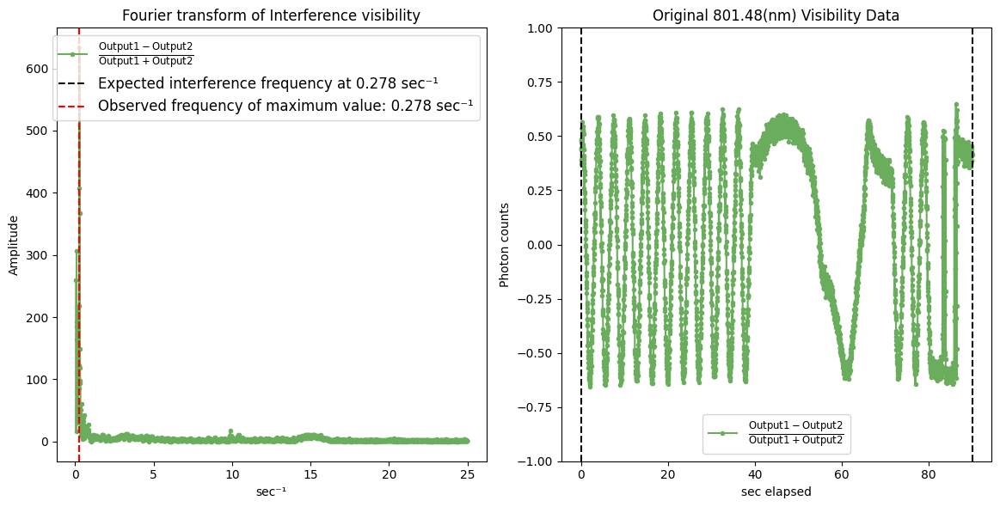

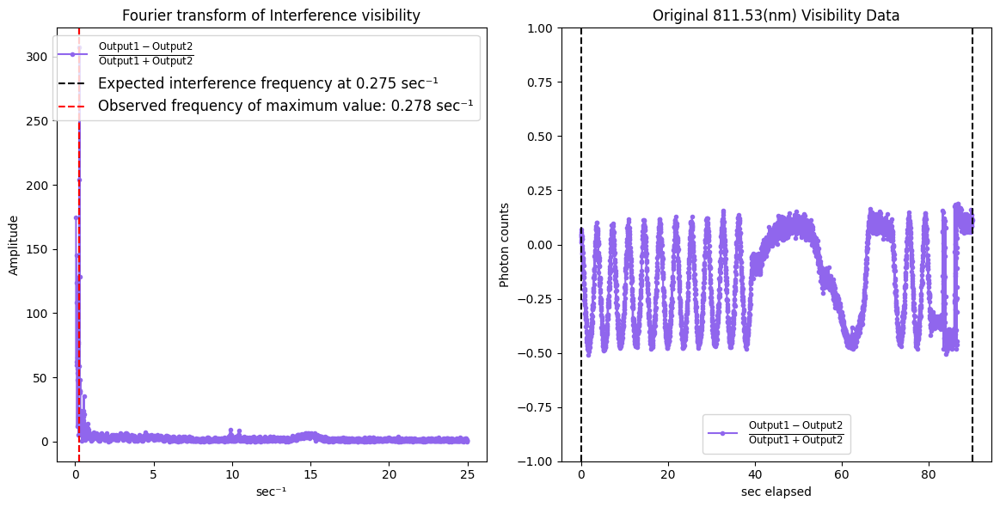

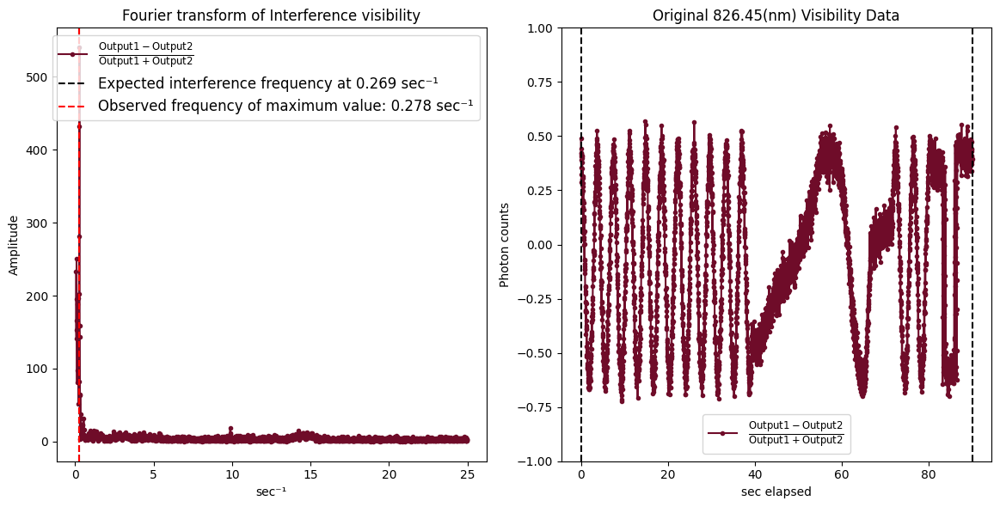

[0.3214884  0.31669123 0.31303018 0.30742389 0.30264138 0.29764468
 0.2923631  0.28889745 0.28048608 0.27808307 0.27453375 0.2694282 ]
[0.32229384 0.32229384 0.31118026 0.31118026 0.31118026 0.2889531
 0.2889531  0.2889531  0.27783952 0.27783952 0.27783952 0.27783952]


Text(0.5, 1.0, 'Frequency dependence on visibility')

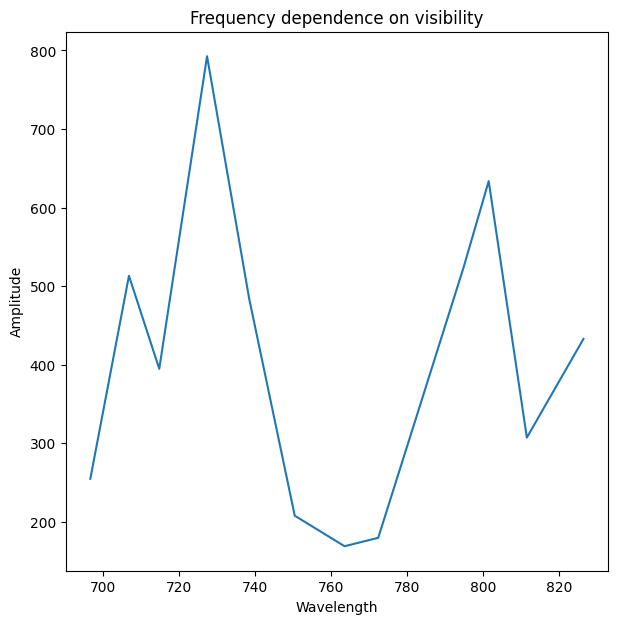

In [34]:
exps = [] #for plotting expected vs. observed fourier peaks
obss = [] #^
#o1_fourier_peaks = []
#o2_fourier_peaks = []
vis_peaks = []
df = frequencies[4] - frequencies[3]
for i, spot in spot_df.iloc[::2].iterrows():
    fft_fig = plt.figure(figsize = (12, 6))

    # Frequency domain
    plt.subplot(121)
    
    # Below plots the modulus of the fft values, and doesn't display points after the nyquist frequency (negative values)
    plt.plot(frequencies[5:model_size//2], np.abs(spot['fft_vis_vals'][5:model_size//2]), marker='.', color=spot['display_color'],
             label=r"$\mathrm{\frac{Output 1 - Output 2}{Output 1 + Output 2}}$")

    int_freq = find_int_freq(spot['wavelength(nm)'])
    exps.append(int_freq)
    plt.axvline(x=int_freq, color='Black', ls='--', label=f'Expected interference frequency at {int_freq:.3f} {time_div_label}⁻¹')

    #finding the actual maximum value observed
    f_of_max_val = (np.abs(spot['fft_vis_vals'][5:model_size//2]).argmax() +5)* df
    obss.append(f_of_max_val)
    plt.axvline(x=f_of_max_val,color='red',ls='--',label=f'Observed frequency of maximum value: {f_of_max_val:.3f} {time_div_label}⁻¹')

    vis_peaks.append( np.abs(spot['fft_vis_vals'][spot['fft_vis_vals'][5:model_size//2].argmax() +5]) )
    
    #plt.ylim(0, 25)
    plt.xlabel(f"{time_div_label}⁻¹")
    plt.ylabel("Amplitude")
    plt.title(f"Fourier transform of Interference visibility")
    plt.legend(fontsize='large')

    # Time domain from before being modeled
    plt.subplot(122)
    plt.plot(bin_centers_rt, spot['vis_vals'], marker='.', color=spot['display_color'], 
             label=r"$\mathrm{\frac{Output 1 - Output 2}{Output 1 + Output 2}}$")

    plt.axvline(x=model_start, color='Black', ls='--')
    plt.axvline(x=model_end, color='Black', ls='--')

    plt.ylim(-1, 1)

    plt.title(f"Original {spot['wavelength(nm)']}(nm) Visibility Data")
    plt.xlabel(f"{time_div_label} elapsed")
    plt.ylabel("Photon counts")
    plt.legend(fontsize='large')

    fft_fig.tight_layout()
    plt.show()
print(np.array(exps))
print(np.array(obss))
fft_fig = plt.figure(figsize = (7, 7))
plt.subplot(111)
plt.plot(nominal_wls,vis_peaks)
plt.xlabel('Wavelength')
plt.ylabel('Amplitude')
plt.title('Frequency dependence on visibility')

In [35]:
###

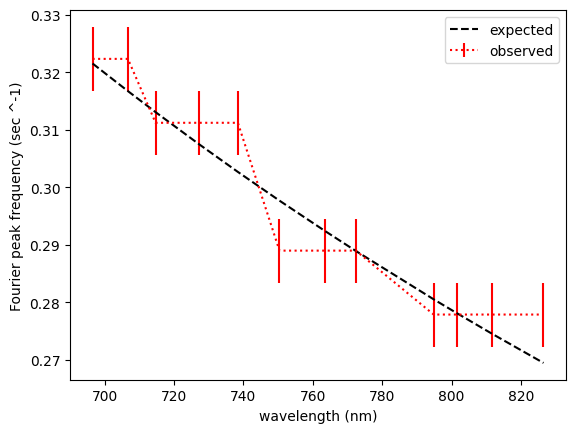

In [36]:
fig, ax = plt.subplots()
ax.errorbar(nominal_wls,obss,label='observed',yerr=np.ones(len(nominal_wls))*(.5*(df)),color='red',ls='dotted') #is the error correct? may not be?
ax.plot(nominal_wls,exps,'k--',label='expected')
ax.set_xlabel('wavelength (nm)')
ax.set_ylabel('Fourier peak frequency (sec ^-1)')
ax.legend()